![](images/feature-engineering.png)

# Finding structure

Let's take a look at a simple way to trying to identify some structure in our data. 

We'll start by loading our training data.

In [1]:
import pandas as pd
data = pd.read_parquet("data/training.parquet")

Our training data (which we generated in [the previous notebook](00-generator.ipynb)) consists of labels (either `legitimate` or `spam`) and short documents of plausible English text.  We can inspect these data:

The name for this process of turning real-world data into a form that a machine learning algorithm can take advantage of is *feature engineering*.  

We'll start with a very basic approach that will let us visualize our data.  We'll first convert our documents to *k-shingles*, or sequences of *k* characters (for some small value of *k*).  This means that a document like

`the quick brown fox jumps over the lazy dog`

would become this sequence of 4-shingles: 

`['the ', 'he q', 'e qu', ' qui', 'quic', 'uick', 'ick ', 'ck b', 'k br', ' bro', 'brow', 'rown', 'own ', 'wn f', 'n fo', ' fox', 'fox ', 'ox j', 'x ju', ' jum', 'jump', 'umps', 'mps ', 'ps o', 's ov', ' ove', 'over', 'ver ', 'er t', 'r th', ' the', 'the ', 'he l', 'e la', ' laz', 'lazy', 'azy ', 'zy d', 'y do', ' dog']`

Shingling gets us a step closer to having vector representations of documents -- ultimately, our assumption is that spam documents will have some k-shingles that legitimate documents don't, and vice versa.  Here's how we'd add a field of shingles to our data:

In [2]:
def doc2shingles(k):
    def kshingles(doc):
        return [doc[i:i + k] for i in range(len(doc) - k + 1)]
    return kshingles

data["shingles"] = data["text"].apply(doc2shingles(4))

Remember, our goal is to be able to learn a function that can separate between documents that are likely to represent legitimate messages (i.e., prose in the style of Jane Austen) or spam messages (i.e., prose in the style of food-product reviews), so we'll still want to transform our lists of shingles into vectors.

1.  We'll collect shingle counts for each example, showing us how frequent each shingle is in a given document;
2.  We'll then turn those raw counts into frequencies (i.e., for a given shingle what percentage of shingle in given document are that word?), giving us a mapping from shingles to frequencies for each document;
3.  Finally, we'll encode these mappings as fixed-size vectors in a space-efficient way, by using a hash function to determine which vector element should get a given frequency.  Hashing has a few advantages, but for our purposes the most important advantage is that we don't need to know all of the shingles we might see in advance. 

(That's what we'll _logically_ do -- we'll _actually_ do these steps a bit out of order because it will make our code simpler and more efficient without changing the results.)

In [3]:
import numpy as np

def hashing_frequency(vecsize, h):
    """ 
    returns a function that will collect shingle frequencies 
    into a vector with _vecsize_ elements and will use 
    the hash function _h_ to choose which vector element 
    to update for a given term
    """
    
    def hf(words):
        if type(words) is type(""):
            # handle both lists of words and space-delimited strings
            words = words.split(" ")
            
        result = np.zeros(vecsize)
        for term in words:
            result[h(term) % vecsize] += 1.0
        
        total = sum(result)
        for i in range(len(result)):
            result[i] /= total

        return result
        
    return hf

In [10]:
a = np.array([hashing_frequency(1024, hash)(v) for v in data["shingles"].sample(2000).values])

So now instead of having documents (which we had from the raw data) or lists of shingles, we have vectors representing shingle frequencies.

Let's reduce the dimensionality of our data so we can make sense of it.

In [5]:
import sklearn.decomposition

DIMENSIONS = 2

pca2 = sklearn.decomposition.PCA(DIMENSIONS)

pca_a = pca2.fit_transform(a)

Let's plot these points to see if there's some structure in our data.

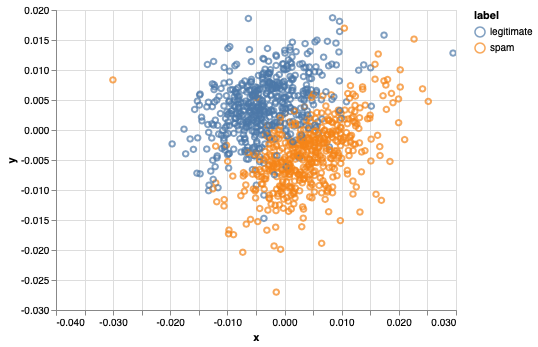

In [15]:
plot_data = pd.concat([data.reset_index(), pca_df], axis=1)

import altair as alt
alt.renderers.enable('notebook')

alt.Chart(plot_data.sample(1000)).encode(x="x", y="y", color="label").mark_point().interactive()

In [11]:
from mlworkflows import featuressimple

simple_summary = featuressimple.SimpleSummaries()
summaries = simple_summary.transform(data["text"])

from sklearn.pipeline import Pipeline

feat_pipeline = Pipeline([
    ('features',simple_summary)
])

from mlworkflows import util
util.serialize_to(feat_pipeline, "feature_pipeline.sav")

features = pd.concat([data[["index", "label"]], pd.DataFrame(summaries)], axis=1)

features.columns = features.columns.astype(str)

In [12]:
import sklearn.decomposition

DIMENSIONS = 2

pca = sklearn.decomposition.PCA(DIMENSIONS)

pca_summaries = pca.fit_transform(features.iloc[:,2:features.shape[1]])

/Users/willb/anaconda/envs/jupyter/lib/python3.6/site-packages/altair/utils/core.py:294: FutureWarning: A future version of pandas will default to `skipna=True`. To silence this warning, pass `skipna=True|False` explicitly.
  attrs['type'] = infer_vegalite_type(data[attrs['field']])


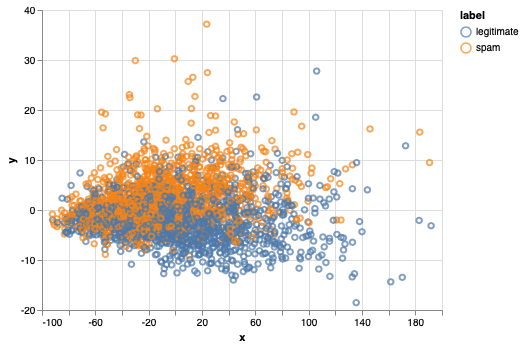

In [13]:
from mlworkflows import plot

pca_summaries_plot_data = pd.concat([data, pd.DataFrame(pca_summaries, columns=["x", "y"])], axis=1)

plot.plot_points(pca_summaries_plot_data, x="x", y="y", color="label")